In [1]:
import os

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import numpy as np
from tqdm import tqdm

import matplotlib.pyplot as plt
import cv2

from DataLoad import CustomImageDataset, data_to_images, images_to_data
from Model_UNet import UNet
from autoencoder import Autoencoder, BigAutoencoder
from utility import *

# Implementation and Training of VideoColorizer UNet model

With or without optical flow as specified


Inputs:
- previous frame: L, ab channels
- (optional) optical flow: 2 channels (x,y - np.array)
- current frame: L channel

Outputs:
- current frame: ab channels

## 1. Data Loading

using the pytorch dataloader and dataset implementation from DataLoad.py

In [2]:
# HYPERPARAMETERS
dataset_path = '~/Documents/Colorization/Datasets/DAVIS/'
dataset_path = os.path.expanduser(dataset_path)
subdir_train = 'train'
subdir_val = 'val'
res = '176p'
method = 'deepflow'
use_flow = True

In [3]:
train_dataset = CustomImageDataset(dataset_path, subdir_train, res, method, use_flow)
val_dataset = CustomImageDataset(dataset_path, subdir_val, res, method, use_flow)

train_dataset_size = len(train_dataset)
val_dataset_size = len(val_dataset)
print(f'Train Dataset size: {train_dataset_size}')
print(f'Validation Dataset size: {val_dataset_size}')

train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True)
train_features, train_labels = next(iter(train_dataloader))
print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")

vid labels: ['bear', 'bike-packing', 'blackswan', 'bmx-bumps', 'bmx-trees', 'boat', 'boxing-fisheye', 'breakdance', 'breakdance-flare', 'bus', 'camel', 'car-roundabout', 'car-shadow', 'car-turn', 'cat-girl', 'classic-car', 'color-run', 'cows', 'crossing', 'dance-jump', 'dance-twirl', 'dancing', 'disc-jockey', 'dog', 'dog-agility', 'dog-gooses', 'dogs-jump', 'dogs-scale', 'drift-chicane', 'drift-straight', 'drift-turn', 'drone', 'elephant', 'flamingo', 'goat', 'gold-fish', 'hike', 'hockey', 'horsejump-high', 'horsejump-low', 'india', 'judo', 'kid-football', 'kite-surf', 'kite-walk', 'koala', 'lab-coat', 'lady-running', 'libby', 'lindy-hop', 'loading', 'longboard', 'lucia', 'mallard-fly', 'mallard-water', 'mbike-trick', 'miami-surf', 'motocross-bumps', 'motocross-jump', 'motorbike', 'night-race', 'paragliding', 'paragliding-launch', 'parkour', 'pigs', 'planes-water', 'rallye', 'rhino', 'rollerblade', 'schoolgirls', 'scooter-black', 'scooter-board', 'scooter-gray', 'sheep', 'shooting', 's

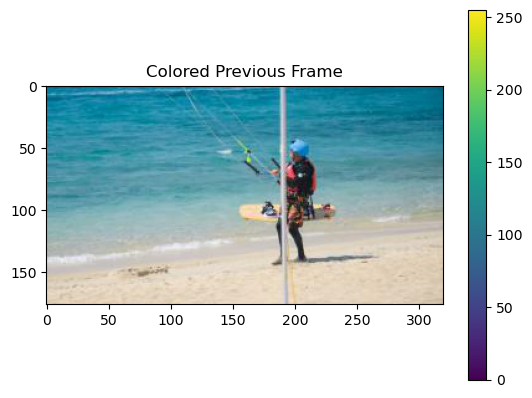

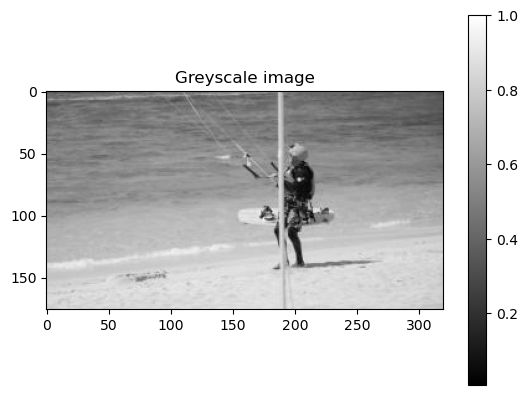

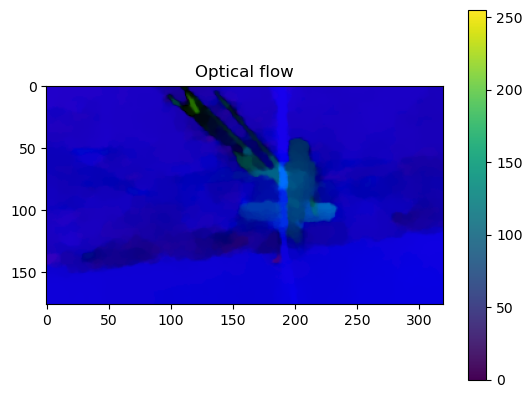

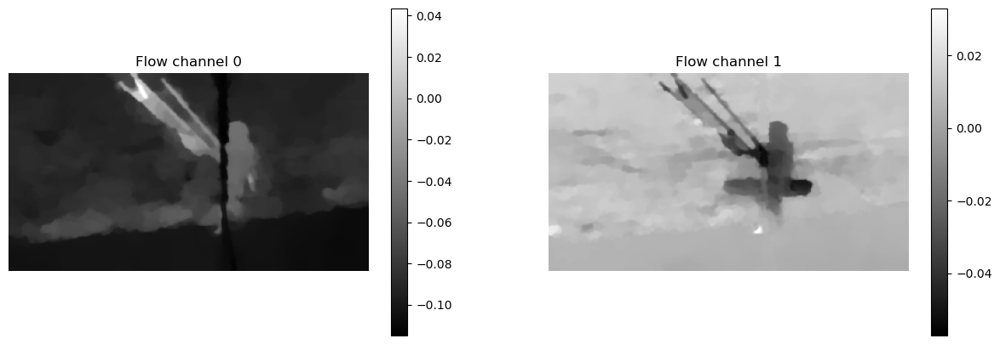

In [4]:
train_features, train_labels = next(iter(train_dataloader))
col_img, flow_img, grey_img = data_to_images(train_features[0], train_labels[0], use_flow=use_flow, input_only=True)

im = plt.imshow(cv2.cvtColor(col_img, cv2.COLOR_BGR2RGB))
cbar = plt.colorbar(im)
plt.title('Colored Previous Frame')
plt.show()

im = plt.imshow(cv2.cvtColor(grey_img, cv2.COLOR_BGR2RGB), cmap='gray')
cbar = plt.colorbar(im)
plt.title('Greyscale image')
plt.show()


if use_flow:
    flow_rgb = uv_2_rgb(flow_img)

    im = plt.imshow(flow_rgb)
    cbar = plt.colorbar(im)
    plt.title('Optical flow')
    plt.show()

    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    for ax in enumerate(axs):
        ax[1].axis('off')
        ax[1].set_title('Flow channel ' + str(ax[0]))
        im = ax[1].imshow(flow_img[:, :, ax[0]], cmap='gray')
        cbar = fig.colorbar(im, ax=ax[1])
        
    plt.show()

## 2. Model Definition

In [5]:
print("Cuda available: ", torch.cuda.is_available())

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device: ", device)

Cuda available:  True
Using device:  cuda


In [6]:
#initialize model
n_input_channels = 6 if use_flow else 4

model = UNet(n_input_channels=n_input_channels)
model.to(device)

# Hyperparameters
learning_rate = 5e-5
batch_size = 16
epochs = 300

# Initialize the loss function
loss_fn = nn.MSELoss()

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Data loader
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

In [7]:
def train_loop(dataloader, model, loss_fn, optimizer, verbose=False):
    """
    Train one epoch
    
    model -- the neural network
    train_loader -- data loader
    optimizer -- network optimizer
    epoch -- number of current epoch
    log_interval -- number of training steps between logs
    """

    size = len(dataloader.dataset)
    model.train()
    train_loss = 0

    for batch, (data, target) in tqdm(enumerate(dataloader)):
        if verbose:
            print('batch No:', batch)
            print('X shape:', data.shape)
            print('y shape:', target.shape)
        
        # Compute prediction and loss
        if torch.cuda.is_available():
            data, target = data.to(device), target.to(device)

        pred = model(data)
        loss = loss_fn(pred, target)

        # Backpropagation
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        train_loss += loss.item()
    train_loss /= size
    return train_loss

In [8]:
def validate(model, dataloader, loss_fn):
    """
    Compute test metrics
    
    model -- the neural network
    test_loader -- data loader
    """
    
    # set model to evaluation mode
    model.eval()
    val_loss = 0
    
    # disable gradients globally
    with torch.no_grad():
        for batch_idx, (data, target) in enumerate(dataloader):
            if torch.cuda.is_available():
                data, target = data.to(device), target.to(device)
            
            # run network and compute metrics
            output = model(data)
            val_loss += loss_fn(output, target).item()  # sum up batch loss
            
    val_loss /= len(dataloader.dataset)
    print('\nValidation set: Average loss: {:.7f}\n'.format(val_loss))
    
    return val_loss

In [9]:
def train(train_data, val_data, architecture, method, flow, lr, batch_size, gamma, save_model, epochs, folder):
    
    model_folder = architecture + '_' + method + '_' + str(epochs) + '_epochs'
    checkpoint_path = os.path.join(folder, model_folder)
    print(f'Checkpoint path: {checkpoint_path}\n')
    make_dir(checkpoint_path)

    
    n_input_channels = 6 if use_flow else 4

    if architecture == 'UNet':
        model = UNet(n_input_channels = n_input_channels)
        
    if architecture == 'Autoencoder':
        model = Autoencoder(n_input_channels = n_input_channels)

    if architecture == 'BigAutoencoder':
        model = BigAutoencoder(n_input_channels = n_input_channels)
    
    model.to(device)
    
    loss_fn = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr = lr)
    # scheduler = StepLR(optimizer, step_size=1, gamma=gamma)
    
    train_dataloader = DataLoader(train_data, batch_size = batch_size, shuffle = True)
    val_dataloader = DataLoader(val_data, batch_size = batch_size, shuffle = True)
      
    train_loss, val_loss = [],[]
    for epoch in range(1, epochs + 1):
        print(f"Epoch {epoch}\n-------------------------------")
        
        train_loss.append( train_loop(train_dataloader, model, loss_fn, optimizer) )
        val_loss.append( validate(model, val_dataloader, loss_fn) )
        # scheduler.step()
        
        if epoch % 5 == 0 and save_model:
            filename = architecture + '_' + method + '_' + str(epoch) + '.pth'
            checkpoint(folder, model, os.path.join(model_folder, filename))
    print("Done!")
    
    return train_loss, val_loss

In [11]:
# HYPERPARAMETERS
architecture = 'BigAutoencoder'
method = 'Deepflow'
flow = True
lr = 5e-5
batch_size = 16
epochs = 150
log_interval = 32
model_path = '~/Documents/Colorization/Models/'
model_path = os.path.expanduser(model_path)
folder = os.path.join(model_path, architecture)
save_model = True
gamma = 0

print(f'Cuda available: {torch.cuda.is_available()}')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}\n')

train_loss_UNet, val_loss_UNet = train(train_dataset, val_dataset, architecture, method, flow, lr, batch_size, gamma, save_model, epochs, folder)

Cuda available: True
Using device: cuda

Checkpoint path: /home/jansp/Documents/Colorization/Models/BigAutoencoder/BigAutoencoder_Deepflow_150_epochs

Epoch 1
-------------------------------


0it [00:00, ?it/s]

383it [00:30, 12.58it/s]



Validation set: Average loss: 0.0052298

Epoch 2
-------------------------------


383it [00:30, 12.57it/s]



Validation set: Average loss: 0.0017716

Epoch 3
-------------------------------


383it [00:30, 12.49it/s]



Validation set: Average loss: 0.0009223

Epoch 4
-------------------------------


383it [00:30, 12.57it/s]



Validation set: Average loss: 0.0005873

Epoch 5
-------------------------------


383it [00:30, 12.36it/s]



Validation set: Average loss: 0.0004030

Epoch 6
-------------------------------


383it [00:30, 12.45it/s]



Validation set: Average loss: 0.0002921

Epoch 7
-------------------------------


383it [00:30, 12.43it/s]



Validation set: Average loss: 0.0002246

Epoch 8
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0001754

Epoch 9
-------------------------------


383it [00:30, 12.56it/s]



Validation set: Average loss: 0.0001409

Epoch 10
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0001163

Epoch 11
-------------------------------


383it [00:30, 12.51it/s]



Validation set: Average loss: 0.0000962

Epoch 12
-------------------------------


383it [00:30, 12.55it/s]



Validation set: Average loss: 0.0000869

Epoch 13
-------------------------------


383it [00:30, 12.40it/s]



Validation set: Average loss: 0.0000757

Epoch 14
-------------------------------


383it [00:30, 12.53it/s]



Validation set: Average loss: 0.0000688

Epoch 15
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000624

Epoch 16
-------------------------------


383it [00:30, 12.45it/s]



Validation set: Average loss: 0.0000583

Epoch 17
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000565

Epoch 18
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000535

Epoch 19
-------------------------------


383it [00:30, 12.56it/s]



Validation set: Average loss: 0.0000514

Epoch 20
-------------------------------


383it [00:30, 12.47it/s]



Validation set: Average loss: 0.0000481

Epoch 21
-------------------------------


383it [00:30, 12.44it/s]



Validation set: Average loss: 0.0000452

Epoch 22
-------------------------------


383it [00:31, 12.33it/s]



Validation set: Average loss: 0.0000444

Epoch 23
-------------------------------


383it [00:30, 12.47it/s]



Validation set: Average loss: 0.0000430

Epoch 24
-------------------------------


383it [00:30, 12.44it/s]



Validation set: Average loss: 0.0000404

Epoch 25
-------------------------------


383it [00:30, 12.46it/s]



Validation set: Average loss: 0.0000395

Epoch 26
-------------------------------


383it [00:30, 12.53it/s]



Validation set: Average loss: 0.0000387

Epoch 27
-------------------------------


383it [00:30, 12.46it/s]



Validation set: Average loss: 0.0000361

Epoch 28
-------------------------------


383it [00:30, 12.45it/s]



Validation set: Average loss: 0.0000358

Epoch 29
-------------------------------


383it [00:30, 12.40it/s]



Validation set: Average loss: 0.0000345

Epoch 30
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000331

Epoch 31
-------------------------------


383it [00:30, 12.51it/s]



Validation set: Average loss: 0.0000322

Epoch 32
-------------------------------


383it [00:30, 12.53it/s]



Validation set: Average loss: 0.0000320

Epoch 33
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000307

Epoch 34
-------------------------------


383it [00:30, 12.46it/s]



Validation set: Average loss: 0.0000304

Epoch 35
-------------------------------


383it [00:30, 12.49it/s]



Validation set: Average loss: 0.0000298

Epoch 36
-------------------------------


383it [00:31, 12.27it/s]



Validation set: Average loss: 0.0000289

Epoch 37
-------------------------------


383it [00:30, 12.51it/s]



Validation set: Average loss: 0.0000283

Epoch 38
-------------------------------


383it [00:30, 12.47it/s]



Validation set: Average loss: 0.0000283

Epoch 39
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000278

Epoch 40
-------------------------------


383it [00:30, 12.53it/s]



Validation set: Average loss: 0.0000272

Epoch 41
-------------------------------


383it [00:30, 12.51it/s]



Validation set: Average loss: 0.0000267

Epoch 42
-------------------------------


383it [00:30, 12.42it/s]



Validation set: Average loss: 0.0000262

Epoch 43
-------------------------------


383it [00:30, 12.50it/s]



Validation set: Average loss: 0.0000257

Epoch 44
-------------------------------


383it [00:30, 12.53it/s]



Validation set: Average loss: 0.0000258

Epoch 45
-------------------------------


383it [00:31, 12.34it/s]



Validation set: Average loss: 0.0000257

Epoch 46
-------------------------------


383it [00:30, 12.51it/s]



Validation set: Average loss: 0.0000254

Epoch 47
-------------------------------


383it [00:30, 12.51it/s]



Validation set: Average loss: 0.0000247

Epoch 48
-------------------------------


383it [00:30, 12.48it/s]



Validation set: Average loss: 0.0000242

Epoch 49
-------------------------------


383it [00:31, 12.26it/s]



Validation set: Average loss: 0.0000237

Epoch 50
-------------------------------


383it [00:30, 12.40it/s]



Validation set: Average loss: 0.0000241

Epoch 51
-------------------------------


383it [00:30, 12.59it/s]



Validation set: Average loss: 0.0000252

Epoch 52
-------------------------------


383it [00:30, 12.55it/s]



Validation set: Average loss: 0.0000257

Epoch 53
-------------------------------


383it [00:30, 12.47it/s]



Validation set: Average loss: 0.0000233

Epoch 54
-------------------------------


383it [00:31, 12.32it/s]



Validation set: Average loss: 0.0000233

Epoch 55
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000227

Epoch 56
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000223

Epoch 57
-------------------------------


383it [00:30, 12.42it/s]



Validation set: Average loss: 0.0000220

Epoch 58
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000221

Epoch 59
-------------------------------


383it [00:30, 12.58it/s]



Validation set: Average loss: 0.0000218

Epoch 60
-------------------------------


383it [00:30, 12.51it/s]



Validation set: Average loss: 0.0000218

Epoch 61
-------------------------------


383it [00:30, 12.56it/s]



Validation set: Average loss: 0.0000215

Epoch 62
-------------------------------


383it [00:30, 12.42it/s]



Validation set: Average loss: 0.0000221

Epoch 63
-------------------------------


383it [00:30, 12.53it/s]



Validation set: Average loss: 0.0000219

Epoch 64
-------------------------------


383it [00:30, 12.53it/s]



Validation set: Average loss: 0.0000214

Epoch 65
-------------------------------


383it [00:30, 12.45it/s]



Validation set: Average loss: 0.0000208

Epoch 66
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000210

Epoch 67
-------------------------------


383it [00:30, 12.57it/s]



Validation set: Average loss: 0.0000206

Epoch 68
-------------------------------


383it [00:30, 12.56it/s]



Validation set: Average loss: 0.0000209

Epoch 69
-------------------------------


383it [00:30, 12.57it/s]



Validation set: Average loss: 0.0000203

Epoch 70
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000205

Epoch 71
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000201

Epoch 72
-------------------------------


383it [00:30, 12.61it/s]



Validation set: Average loss: 0.0000200

Epoch 73
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000202

Epoch 74
-------------------------------


383it [00:30, 12.51it/s]



Validation set: Average loss: 0.0000196

Epoch 75
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000198

Epoch 76
-------------------------------


383it [00:30, 12.51it/s]



Validation set: Average loss: 0.0000197

Epoch 77
-------------------------------


383it [00:30, 12.58it/s]



Validation set: Average loss: 0.0000192

Epoch 78
-------------------------------


383it [00:30, 12.60it/s]



Validation set: Average loss: 0.0000190

Epoch 79
-------------------------------


383it [00:30, 12.55it/s]



Validation set: Average loss: 0.0000193

Epoch 80
-------------------------------


383it [00:30, 12.48it/s]



Validation set: Average loss: 0.0000193

Epoch 81
-------------------------------


383it [00:30, 12.58it/s]



Validation set: Average loss: 0.0000192

Epoch 82
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000191

Epoch 83
-------------------------------


383it [00:30, 12.50it/s]



Validation set: Average loss: 0.0000189

Epoch 84
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000193

Epoch 85
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000188

Epoch 86
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000191

Epoch 87
-------------------------------


383it [00:30, 12.58it/s]



Validation set: Average loss: 0.0000191

Epoch 88
-------------------------------


383it [00:30, 12.56it/s]



Validation set: Average loss: 0.0000191

Epoch 89
-------------------------------


383it [00:30, 12.51it/s]



Validation set: Average loss: 0.0000186

Epoch 90
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000191

Epoch 91
-------------------------------


383it [00:30, 12.48it/s]



Validation set: Average loss: 0.0000185

Epoch 92
-------------------------------


383it [00:30, 12.50it/s]



Validation set: Average loss: 0.0000184

Epoch 93
-------------------------------


383it [00:30, 12.51it/s]



Validation set: Average loss: 0.0000189

Epoch 94
-------------------------------


383it [00:30, 12.62it/s]



Validation set: Average loss: 0.0000183

Epoch 95
-------------------------------


383it [00:30, 12.57it/s]



Validation set: Average loss: 0.0000188

Epoch 96
-------------------------------


383it [00:30, 12.57it/s]



Validation set: Average loss: 0.0000183

Epoch 97
-------------------------------


383it [00:30, 12.58it/s]



Validation set: Average loss: 0.0000184

Epoch 98
-------------------------------


383it [00:30, 12.60it/s]



Validation set: Average loss: 0.0000184

Epoch 99
-------------------------------


383it [00:30, 12.59it/s]



Validation set: Average loss: 0.0000179

Epoch 100
-------------------------------


383it [00:30, 12.59it/s]



Validation set: Average loss: 0.0000182

Epoch 101
-------------------------------


383it [00:30, 12.48it/s]



Validation set: Average loss: 0.0000180

Epoch 102
-------------------------------


383it [00:30, 12.47it/s]



Validation set: Average loss: 0.0000183

Epoch 103
-------------------------------


383it [00:31, 12.25it/s]



Validation set: Average loss: 0.0000183

Epoch 104
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000178

Epoch 105
-------------------------------


383it [00:30, 12.61it/s]



Validation set: Average loss: 0.0000181

Epoch 106
-------------------------------


383it [00:30, 12.50it/s]



Validation set: Average loss: 0.0000181

Epoch 107
-------------------------------


383it [00:31, 12.33it/s]



Validation set: Average loss: 0.0000181

Epoch 108
-------------------------------


383it [00:30, 12.51it/s]



Validation set: Average loss: 0.0000179

Epoch 109
-------------------------------


383it [00:30, 12.48it/s]



Validation set: Average loss: 0.0000179

Epoch 110
-------------------------------


383it [00:30, 12.48it/s]



Validation set: Average loss: 0.0000178

Epoch 111
-------------------------------


383it [00:30, 12.50it/s]



Validation set: Average loss: 0.0000178

Epoch 112
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000177

Epoch 113
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000176

Epoch 114
-------------------------------


383it [00:30, 12.60it/s]



Validation set: Average loss: 0.0000177

Epoch 115
-------------------------------


383it [00:30, 12.53it/s]



Validation set: Average loss: 0.0000176

Epoch 116
-------------------------------


383it [00:30, 12.51it/s]



Validation set: Average loss: 0.0000178

Epoch 117
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000175

Epoch 118
-------------------------------


383it [00:30, 12.50it/s]



Validation set: Average loss: 0.0000177

Epoch 119
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000176

Epoch 120
-------------------------------


383it [00:30, 12.47it/s]



Validation set: Average loss: 0.0000173

Epoch 121
-------------------------------


383it [00:30, 12.57it/s]



Validation set: Average loss: 0.0000176

Epoch 122
-------------------------------


383it [00:30, 12.59it/s]



Validation set: Average loss: 0.0000179

Epoch 123
-------------------------------


383it [00:30, 12.61it/s]



Validation set: Average loss: 0.0000174

Epoch 124
-------------------------------


383it [00:30, 12.58it/s]



Validation set: Average loss: 0.0000178

Epoch 125
-------------------------------


383it [00:30, 12.55it/s]



Validation set: Average loss: 0.0000177

Epoch 126
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000176

Epoch 127
-------------------------------


383it [00:30, 12.53it/s]



Validation set: Average loss: 0.0000179

Epoch 128
-------------------------------


383it [00:30, 12.53it/s]



Validation set: Average loss: 0.0000175

Epoch 129
-------------------------------


383it [00:30, 12.55it/s]



Validation set: Average loss: 0.0000175

Epoch 130
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000173

Epoch 131
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000174

Epoch 132
-------------------------------


383it [00:30, 12.45it/s]



Validation set: Average loss: 0.0000176

Epoch 133
-------------------------------


383it [00:30, 12.44it/s]



Validation set: Average loss: 0.0000179

Epoch 134
-------------------------------


383it [00:30, 12.50it/s]



Validation set: Average loss: 0.0000173

Epoch 135
-------------------------------


383it [00:30, 12.55it/s]



Validation set: Average loss: 0.0000175

Epoch 136
-------------------------------


383it [00:30, 12.48it/s]



Validation set: Average loss: 0.0000176

Epoch 137
-------------------------------


383it [00:30, 12.39it/s]



Validation set: Average loss: 0.0000181

Epoch 138
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000173

Epoch 139
-------------------------------


383it [00:31, 12.35it/s]



Validation set: Average loss: 0.0000176

Epoch 140
-------------------------------


383it [00:30, 12.52it/s]



Validation set: Average loss: 0.0000175

Epoch 141
-------------------------------


383it [00:30, 12.50it/s]



Validation set: Average loss: 0.0000174

Epoch 142
-------------------------------


383it [00:31, 12.34it/s]



Validation set: Average loss: 0.0000171

Epoch 143
-------------------------------


383it [00:30, 12.49it/s]



Validation set: Average loss: 0.0000177

Epoch 144
-------------------------------


383it [00:30, 12.48it/s]



Validation set: Average loss: 0.0000175

Epoch 145
-------------------------------


383it [00:30, 12.49it/s]



Validation set: Average loss: 0.0000177

Epoch 146
-------------------------------


383it [00:30, 12.47it/s]



Validation set: Average loss: 0.0000175

Epoch 147
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000177

Epoch 148
-------------------------------


383it [00:30, 12.55it/s]



Validation set: Average loss: 0.0000173

Epoch 149
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000175

Epoch 150
-------------------------------


383it [00:30, 12.54it/s]



Validation set: Average loss: 0.0000174

Done!


In [11]:
epochs = 150
model_folder = 'UNet_noFlow_'+str(epochs)+'_epochs'
checkpoint_path = os.path.join(UNet_folder, model_folder)
print('Checkpoint path:', checkpoint_path)
make_dir(checkpoint_path)

save_model = True
loss_arr_train = []
loss_arr_test = []
test_limit = 500
train_len = len(train_dataloader.dataset)
test_len = len(val_dataloader.dataset)

for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")

    # Train the model
    loss_i_train = train_loop(train_dataloader, model, loss_fn, optimizer)
    print(f"Training Error: {loss_i_train}")
    loss_arr_train.append(loss_i_train)

    # Save model checkpoint
    if (t+1) % 5 == 0 and save_model:
        filename = 'UNet_noFlow_epoch_' + str(t+1) + '.pth'
        checkpoint(model, os.path.join(model_folder, filename))


    # Test the model
    running_tst_loss = 0
    with torch.no_grad():
        for i, (X, y) in enumerate(train_dataloader):
            # Compute prediction and loss
            if torch.cuda.is_available():
                X, y = X.to(device), y.to(device)
            pred = model(X)
            loss = loss_fn(pred, y)
            running_tst_loss += loss.item()
    avg_tst_loss = running_tst_loss / test_len
    loss_arr_test.append(avg_tst_loss)
    print(f"Test Error: {avg_tst_loss}")

print("Done!")

Checkpoint path: /home/jansp/Documents/Colorization/Models/UNet/UNet_noFlow_150_epochs
Epoch 1
-------------------------------


383it [02:24,  2.66it/s]


Training Error: 0.0008668934319158586
Test Error: 4.234764968108114e-05
Epoch 2
-------------------------------


383it [02:26,  2.62it/s]


Training Error: 2.6165199317895096e-05
Test Error: 3.4599585524119904e-05
Epoch 3
-------------------------------


383it [02:27,  2.60it/s]


Training Error: 2.3786365596664903e-05
Test Error: 3.2880160031507127e-05
Epoch 4
-------------------------------


383it [02:27,  2.59it/s]


Training Error: 2.309869449650677e-05
Test Error: 3.190752131895688e-05
Epoch 5
-------------------------------


383it [02:30,  2.54it/s]


Training Error: 2.2589024664007856e-05
Test Error: 3.1433652444926945e-05
Epoch 6
-------------------------------


383it [02:32,  2.51it/s]


Training Error: 2.2324062694617173e-05
Test Error: 3.154424975272613e-05
Epoch 7
-------------------------------


383it [02:31,  2.52it/s]


Training Error: 2.2044099360847818e-05
Test Error: 3.099034291962097e-05
Epoch 8
-------------------------------


383it [02:32,  2.51it/s]


Training Error: 2.1795802198157254e-05
Test Error: 3.102100190854226e-05
Epoch 9
-------------------------------


383it [02:30,  2.55it/s]


Training Error: 2.169219604867272e-05
Test Error: 3.024786627874063e-05
Epoch 10
-------------------------------


383it [02:23,  2.67it/s]


Training Error: 2.133592809193873e-05
Test Error: 2.9739662056305894e-05
Epoch 11
-------------------------------


383it [02:23,  2.66it/s]


Training Error: 2.1189884980322277e-05
Test Error: 3.0624195369455264e-05
Epoch 12
-------------------------------


383it [02:23,  2.67it/s]


Training Error: 2.101700829162989e-05
Test Error: 2.949764569469456e-05
Epoch 13
-------------------------------


383it [02:23,  2.67it/s]


Training Error: 2.0918011932245108e-05
Test Error: 2.9076358330510427e-05
Epoch 14
-------------------------------


383it [02:22,  2.68it/s]


Training Error: 2.0806700102427756e-05
Test Error: 2.9080356334479467e-05
Epoch 15
-------------------------------


383it [02:22,  2.69it/s]


Training Error: 2.0632580970832608e-05
Test Error: 2.9232332764405766e-05
Epoch 16
-------------------------------


383it [02:22,  2.68it/s]


Training Error: 2.0486144034630987e-05
Test Error: 2.8779114930970265e-05
Epoch 17
-------------------------------


383it [02:22,  2.69it/s]


Training Error: 2.0256931304410418e-05
Test Error: 2.8156296888550127e-05
Epoch 18
-------------------------------


383it [02:22,  2.69it/s]


Training Error: 2.0105004561857976e-05
Test Error: 2.8365223015161636e-05
Epoch 19
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 1.987934610482163e-05
Test Error: 2.828408358052709e-05
Epoch 20
-------------------------------


383it [02:23,  2.67it/s]


Training Error: 1.978742234610099e-05
Test Error: 2.7846537204823107e-05
Epoch 21
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.9656488470464943e-05
Test Error: 2.7726835206623136e-05
Epoch 22
-------------------------------


383it [02:28,  2.57it/s]


Training Error: 1.9265065693420406e-05
Test Error: 2.6900340272159492e-05
Epoch 23
-------------------------------


383it [02:30,  2.54it/s]


Training Error: 1.9051473132431997e-05
Test Error: 2.717098929376031e-05
Epoch 24
-------------------------------


383it [02:31,  2.53it/s]


Training Error: 1.878251607956853e-05
Test Error: 2.6221106040961953e-05
Epoch 25
-------------------------------


383it [02:31,  2.54it/s]


Training Error: 1.849158372593089e-05
Test Error: 2.581551311609305e-05
Epoch 26
-------------------------------


383it [02:30,  2.54it/s]


Training Error: 1.8303859125636383e-05
Test Error: 2.5601510939547247e-05
Epoch 27
-------------------------------


383it [02:31,  2.54it/s]


Training Error: 1.8002601892015833e-05
Test Error: 2.5679842770774418e-05
Epoch 28
-------------------------------


383it [02:31,  2.53it/s]


Training Error: 1.768459061001759e-05
Test Error: 2.4747037305469686e-05
Epoch 29
-------------------------------


383it [02:31,  2.53it/s]


Training Error: 1.7634832130503545e-05
Test Error: 2.4113256154965645e-05
Epoch 30
-------------------------------


383it [02:31,  2.53it/s]


Training Error: 1.748214616234845e-05
Test Error: 2.4223431349431242e-05
Epoch 31
-------------------------------


383it [02:30,  2.55it/s]


Training Error: 1.7044928690038643e-05
Test Error: 2.437888233880922e-05
Epoch 32
-------------------------------


383it [02:31,  2.53it/s]


Training Error: 1.668484813032555e-05
Test Error: 2.2914674398769557e-05
Epoch 33
-------------------------------


383it [02:31,  2.53it/s]


Training Error: 1.6461266713009036e-05
Test Error: 2.392716304947734e-05
Epoch 34
-------------------------------


383it [02:31,  2.53it/s]


Training Error: 1.5763292001783648e-05
Test Error: 2.1492360755709577e-05
Epoch 35
-------------------------------


383it [02:31,  2.53it/s]


Training Error: 1.5033143211732156e-05
Test Error: 2.071067669594076e-05
Epoch 36
-------------------------------


383it [02:29,  2.57it/s]


Training Error: 1.4754687305818802e-05
Test Error: 2.1199022987477493e-05
Epoch 37
-------------------------------


383it [02:27,  2.60it/s]


Training Error: 1.4540452924022714e-05
Test Error: 2.042566663341724e-05
Epoch 38
-------------------------------


383it [02:27,  2.60it/s]


Training Error: 1.4033276691115116e-05
Test Error: 1.9323997316354912e-05
Epoch 39
-------------------------------


383it [02:27,  2.59it/s]


Training Error: 1.3923451185546725e-05
Test Error: 2.0420685416832352e-05
Epoch 40
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.3644803770197188e-05
Test Error: 1.8824738066945832e-05
Epoch 41
-------------------------------


383it [02:32,  2.52it/s]


Training Error: 1.3349634932559066e-05
Test Error: 1.836682064195985e-05
Epoch 42
-------------------------------


383it [02:32,  2.51it/s]


Training Error: 1.3198486045533448e-05
Test Error: 1.934796496580357e-05
Epoch 43
-------------------------------


383it [02:32,  2.52it/s]


Training Error: 1.3146225672454828e-05
Test Error: 1.918418014847029e-05
Epoch 44
-------------------------------


383it [02:30,  2.54it/s]


Training Error: 1.2788775191839402e-05
Test Error: 1.7405569416142598e-05
Epoch 45
-------------------------------


383it [02:23,  2.66it/s]


Training Error: 1.2874551395500208e-05
Test Error: 1.7699220648460645e-05
Epoch 46
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.2568241265009792e-05
Test Error: 1.7545090696768494e-05
Epoch 47
-------------------------------


383it [02:39,  2.40it/s]


Training Error: 1.2089740847632894e-05
Test Error: 1.699333487926601e-05
Epoch 48
-------------------------------


383it [02:27,  2.60it/s]


Training Error: 1.2013260763249735e-05
Test Error: 1.7172201461545665e-05
Epoch 49
-------------------------------


383it [02:27,  2.60it/s]


Training Error: 1.1729685951190372e-05
Test Error: 1.6150371037063584e-05
Epoch 50
-------------------------------


383it [02:26,  2.61it/s]


Training Error: 1.150835945517791e-05
Test Error: 1.670581979885389e-05
Epoch 51
-------------------------------


383it [02:31,  2.52it/s]


Training Error: 1.147640547228573e-05
Test Error: 1.6077831878646977e-05
Epoch 52
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.1007410500085726e-05
Test Error: 1.6494595084387347e-05
Epoch 53
-------------------------------


383it [02:27,  2.60it/s]


Training Error: 1.0997048668275581e-05
Test Error: 1.568030423489593e-05
Epoch 54
-------------------------------


383it [02:31,  2.52it/s]


Training Error: 1.063209194206289e-05
Test Error: 1.4629321131670385e-05
Epoch 55
-------------------------------


383it [02:29,  2.57it/s]


Training Error: 1.0411765224230833e-05
Test Error: 1.4217825746190674e-05
Epoch 56
-------------------------------


383it [02:30,  2.55it/s]


Training Error: 1.013985881354514e-05
Test Error: 1.4394425257975215e-05
Epoch 57
-------------------------------


383it [02:33,  2.49it/s]


Training Error: 1.0097546949599793e-05
Test Error: 1.3966180481643446e-05
Epoch 58
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 9.945405430720885e-06
Test Error: 1.4274842417055172e-05
Epoch 59
-------------------------------


383it [02:32,  2.51it/s]


Training Error: 9.676086582708419e-06
Test Error: 1.4907386289282672e-05
Epoch 60
-------------------------------


383it [02:29,  2.56it/s]


Training Error: 1.0398598082622999e-05
Test Error: 1.4121974606529909e-05
Epoch 61
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 9.426645340498272e-06
Test Error: 1.3093888226110182e-05
Epoch 62
-------------------------------


383it [02:26,  2.61it/s]


Training Error: 9.161380129697255e-06
Test Error: 1.2852433551584168e-05
Epoch 63
-------------------------------


383it [02:31,  2.52it/s]


Training Error: 9.032531156049065e-06
Test Error: 1.3756537812999644e-05
Epoch 64
-------------------------------


383it [02:22,  2.68it/s]


Training Error: 8.936699570640563e-06
Test Error: 1.2362467461773324e-05
Epoch 65
-------------------------------


383it [02:22,  2.69it/s]


Training Error: 8.80555451384311e-06
Test Error: 1.2077523158243114e-05
Epoch 66
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 8.686758282951125e-06
Test Error: 1.2321242126779031e-05
Epoch 67
-------------------------------


383it [02:20,  2.73it/s]


Training Error: 8.505214525400925e-06
Test Error: 1.1912514860004767e-05
Epoch 68
-------------------------------


383it [02:18,  2.77it/s]


Training Error: 8.383643487123948e-06
Test Error: 1.195885148701092e-05
Epoch 69
-------------------------------


383it [02:17,  2.78it/s]


Training Error: 8.319533535618571e-06
Test Error: 1.1598908034742366e-05
Epoch 70
-------------------------------


383it [02:18,  2.77it/s]


Training Error: 8.22921603373656e-06
Test Error: 1.1527587260691992e-05
Epoch 71
-------------------------------


383it [02:18,  2.77it/s]


Training Error: 8.058708627205071e-06
Test Error: 1.1304288566154557e-05
Epoch 72
-------------------------------


383it [02:18,  2.77it/s]


Training Error: 7.90781114604082e-06
Test Error: 1.1171820323465067e-05
Epoch 73
-------------------------------


383it [02:18,  2.77it/s]


Training Error: 7.875440716257866e-06
Test Error: 1.0896670715333635e-05
Epoch 74
-------------------------------


383it [02:18,  2.77it/s]


Training Error: 7.932201197764622e-06
Test Error: 1.0659914223483442e-05
Epoch 75
-------------------------------


383it [02:25,  2.64it/s]


Training Error: 7.755408529339678e-06
Test Error: 1.060480048585709e-05
Epoch 76
-------------------------------


383it [02:24,  2.64it/s]


Training Error: 7.576924601553636e-06
Test Error: 1.0596550472891303e-05
Epoch 77
-------------------------------


383it [02:26,  2.61it/s]


Training Error: 7.539807277797511e-06
Test Error: 1.0646969709611127e-05
Epoch 78
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 7.4392219541634575e-06
Test Error: 1.077989159899449e-05
Epoch 79
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 7.412097802598501e-06
Test Error: 1.0290405196900355e-05
Epoch 80
-------------------------------


383it [02:22,  2.69it/s]


Training Error: 7.329303874581231e-06
Test Error: 1.0166031926120114e-05
Epoch 81
-------------------------------


383it [02:22,  2.69it/s]


Training Error: 7.176714154096894e-06
Test Error: 1.007906810931066e-05
Epoch 82
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 7.122901762649889e-06
Test Error: 9.896951516768443e-06
Epoch 83
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 7.19047391044077e-06
Test Error: 1.0090520229116211e-05
Epoch 84
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 6.990578815963945e-06
Test Error: 9.676449715496144e-06
Epoch 85
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.90986759870343e-06
Test Error: 9.722003193457095e-06
Epoch 86
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.928404314376223e-06
Test Error: 9.829247841884756e-06
Epoch 87
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.859608273330973e-06
Test Error: 9.584632469475899e-06
Epoch 88
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 6.8021818038483975e-06
Test Error: 9.39918561218494e-06
Epoch 89
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.7126420587837475e-06
Test Error: 1.1024273605168371e-05
Epoch 90
-------------------------------


383it [02:22,  2.69it/s]


Training Error: 6.64381398711306e-06
Test Error: 9.511927025953439e-06
Epoch 91
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.635919666459415e-06
Test Error: 9.454753543886235e-06
Epoch 92
-------------------------------


383it [02:22,  2.69it/s]


Training Error: 6.636890892036294e-06
Test Error: 9.005532072276562e-06
Epoch 93
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.552036709664633e-06
Test Error: 9.260696313301903e-06
Epoch 94
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 6.482831023761883e-06
Test Error: 9.041748107510675e-06
Epoch 95
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.344276343658171e-06
Test Error: 9.189849025561773e-06
Epoch 96
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.338729218031585e-06
Test Error: 9.225293409279538e-06
Epoch 97
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.354212977924366e-06
Test Error: 9.030096090875169e-06
Epoch 98
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.277037202937176e-06
Test Error: 8.809988972407827e-06
Epoch 99
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.278069116993469e-06
Test Error: 8.541929157588499e-06
Epoch 100
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.122174421798751e-06
Test Error: 8.736186404584496e-06
Epoch 101
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.123612650754825e-06
Test Error: 8.66556206094376e-06
Epoch 102
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.034516550010612e-06
Test Error: 8.360317371659255e-06
Epoch 103
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 6.037558356378622e-06
Test Error: 8.524771417089344e-06
Epoch 104
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.001366724000757e-06
Test Error: 8.86026227480788e-06
Epoch 105
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.970582928091305e-06
Test Error: 8.231773372918489e-06
Epoch 106
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 6.0373615166315475e-06
Test Error: 8.223499334976454e-06
Epoch 107
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.832487780963428e-06
Test Error: 8.140871892902833e-06
Epoch 108
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.751230610594031e-06
Test Error: 8.110914169871345e-06
Epoch 109
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.790615035569199e-06
Test Error: 8.603002652307622e-06
Epoch 110
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.806281665441792e-06
Test Error: 8.123036722433124e-06
Epoch 111
-------------------------------


383it [02:22,  2.69it/s]


Training Error: 5.717659699538008e-06
Test Error: 8.111533334495444e-06
Epoch 112
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 5.6618571130738246e-06
Test Error: 8.394923010941798e-06
Epoch 113
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.678898801415307e-06
Test Error: 7.836732026623428e-06
Epoch 114
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.578410873692791e-06
Test Error: 7.876382425011899e-06
Epoch 115
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.611859973111579e-06
Test Error: 7.887377504360943e-06
Epoch 116
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.5610241672428595e-06
Test Error: 8.100124708747629e-06
Epoch 117
-------------------------------


383it [02:22,  2.69it/s]


Training Error: 5.525341270939294e-06
Test Error: 7.925843781911815e-06
Epoch 118
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.437097014409222e-06
Test Error: 7.648675309442129e-06
Epoch 119
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 5.443690272416923e-06
Test Error: 7.753473349752043e-06
Epoch 120
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.3951408428707185e-06
Test Error: 7.407194139988052e-06
Epoch 121
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 5.350565279614918e-06
Test Error: 7.795791878851123e-06
Epoch 122
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.366091858601509e-06
Test Error: 7.4677391500733425e-06
Epoch 123
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 5.322857267534907e-06
Test Error: 7.549267386113772e-06
Epoch 124
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.328836866068421e-06
Test Error: 7.3385687503307256e-06
Epoch 125
-------------------------------


383it [02:22,  2.69it/s]


Training Error: 5.2220340897781264e-06
Test Error: 7.2337315562738995e-06
Epoch 126
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.2501783191835935e-06
Test Error: 7.541805350936354e-06
Epoch 127
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 5.265925615498003e-06
Test Error: 7.32432687763557e-06
Epoch 128
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.173835685940876e-06
Test Error: 7.19482814272649e-06
Epoch 129
-------------------------------


383it [02:22,  2.69it/s]


Training Error: 5.162417356066948e-06
Test Error: 7.2068572207071054e-06
Epoch 130
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.087402137923068e-06
Test Error: 7.093982559227799e-06
Epoch 131
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.0361290170321174e-06
Test Error: 6.987671341212937e-06
Epoch 132
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.110591987852394e-06
Test Error: 7.311083090321012e-06
Epoch 133
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 5.052091427425849e-06
Test Error: 7.305616620417115e-06
Epoch 134
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 5.007670625738907e-06
Test Error: 6.813295765453033e-06
Epoch 135
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 4.962482374048378e-06
Test Error: 6.808379421946247e-06
Epoch 136
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 4.897076011729059e-06
Test Error: 7.023896265073509e-06
Epoch 137
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 4.917351426767731e-06
Test Error: 7.0475644894974755e-06
Epoch 138
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 4.89151527608957e-06
Test Error: 6.746119653918733e-06
Epoch 139
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 4.860528826089014e-06
Test Error: 7.243553465775255e-06
Epoch 140
-------------------------------


383it [02:22,  2.69it/s]


Training Error: 4.924324363581279e-06
Test Error: 6.863485894562607e-06
Epoch 141
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 4.891954306634662e-06
Test Error: 6.957858300261756e-06
Epoch 142
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 4.767780942079062e-06
Test Error: 6.885674030888401e-06
Epoch 143
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 4.744050016834277e-06
Test Error: 6.79936582165047e-06
Epoch 144
-------------------------------


383it [02:22,  2.70it/s]


Training Error: 4.7525105765802956e-06
Test Error: 6.785068915262484e-06
Epoch 145
-------------------------------


383it [02:21,  2.70it/s]


Training Error: 4.704986663409117e-06
Test Error: 6.5682054254365436e-06
Epoch 146
-------------------------------


383it [02:23,  2.67it/s]


Training Error: 4.657420359281552e-06
Test Error: 6.70425558332176e-06
Epoch 147
-------------------------------


383it [02:23,  2.68it/s]


Training Error: 4.667253879028463e-06
Test Error: 6.617101519589563e-06
Epoch 148
-------------------------------


383it [02:23,  2.67it/s]


Training Error: 4.670900151808815e-06
Test Error: 6.524646968736542e-06
Epoch 149
-------------------------------


383it [02:23,  2.67it/s]


Training Error: 4.579774148680176e-06
Test Error: 6.381972677984406e-06
Epoch 150
-------------------------------


383it [02:23,  2.66it/s]


Training Error: 4.590134971394205e-06
Test Error: 6.509077195881185e-06
Done!


In [13]:
model_folder = architecture + '_' + method + '_' + str(epochs) + '_epochs'
np.save(os.path.join(folder, model_folder, 'loss_arr_train.npy'), train_loss_UNet)
np.save(os.path.join(folder, model_folder, 'loss_arr_test.npy'), val_loss_UNet)

print(np.shape(train_loss_UNet))
print(np.shape(val_loss_UNet))

(150,)
(150,)


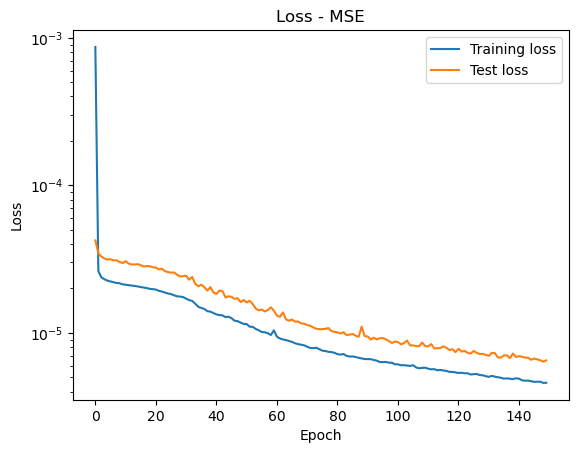

In [14]:
plt.plot(loss_arr_train, label='Training loss')
plt.plot(loss_arr_test, label='Test loss')
plt.title('Loss - MSE')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.yscale('log')
plt.show()

Feature batch shape: torch.Size([16, 4, 320, 176])
Labels batch shape: torch.Size([16, 2, 320, 176])
torch.Size([16, 2, 320, 176])


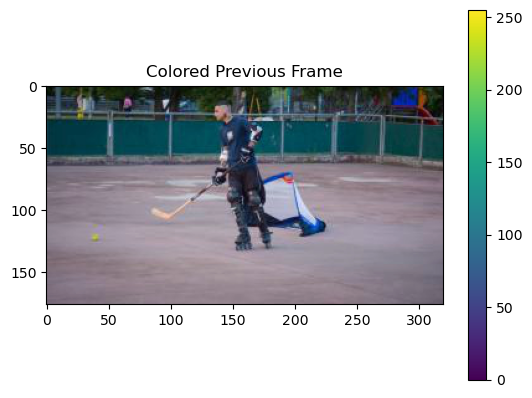

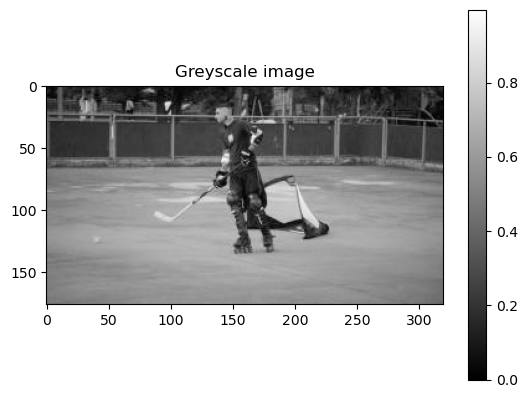

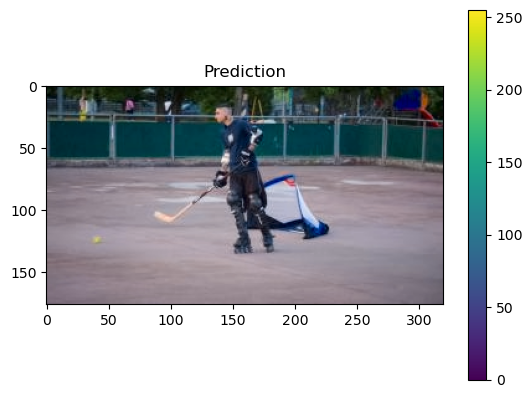

In [15]:
train_features, train_labels = next(iter(train_dataloader))

print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")

prediction = model(train_features.to(device))
prediction = prediction.cpu()
prediction = prediction.detach()
#prediction = prediction.numpy()
print(prediction.shape)


col_img, flow_img, grey_img, pred_img = data_to_images(train_features[0], prediction[0], use_flow=use_flow, input_only=False)

im = plt.imshow(col_img)
cbar = plt.colorbar(im)
plt.title('Colored Previous Frame')
plt.show()

im = plt.imshow(grey_img, cmap='gray')
cbar = plt.colorbar(im)
plt.title('Greyscale image')
plt.show()

im = plt.imshow(pred_img)
cbar = plt.colorbar(im)
plt.title('Prediction')
plt.show()


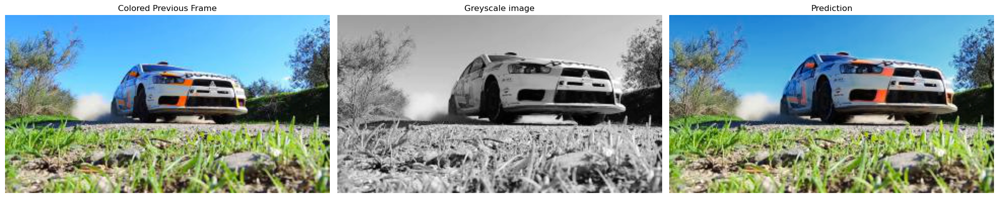

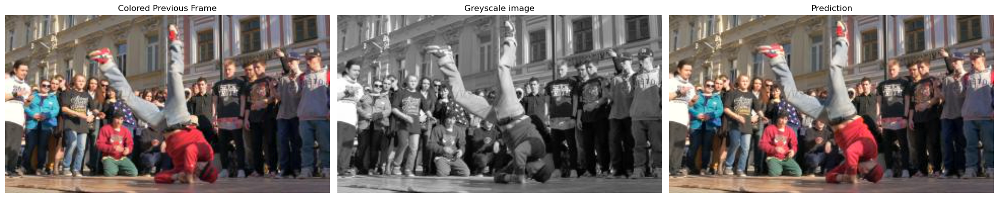

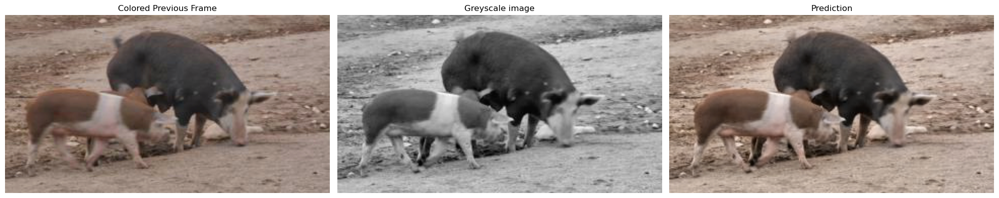

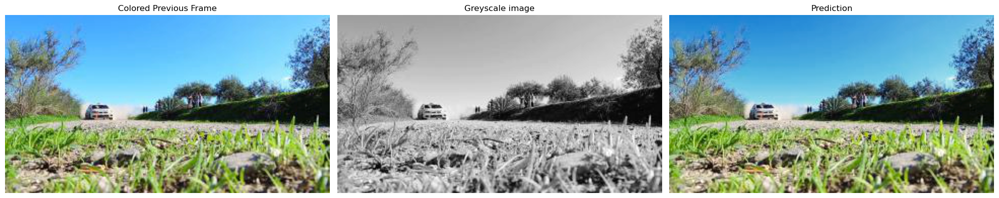

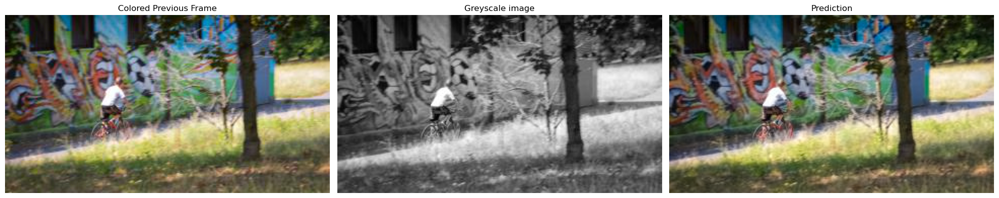

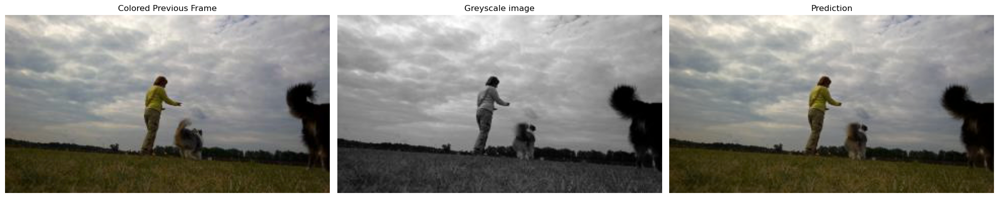

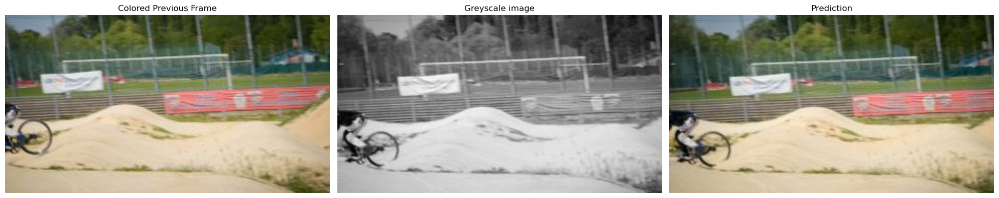

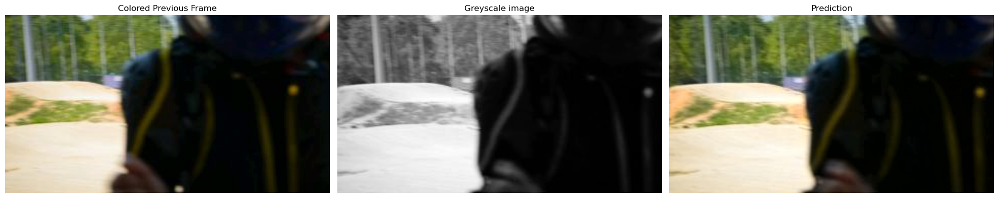

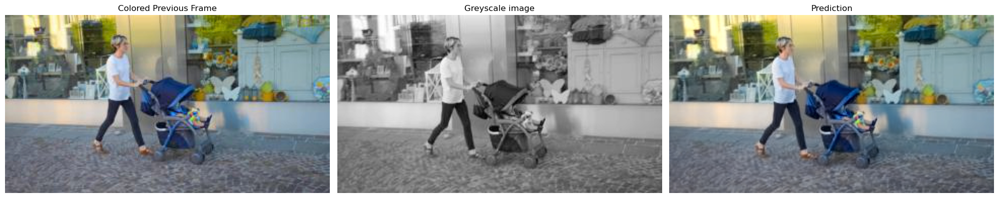

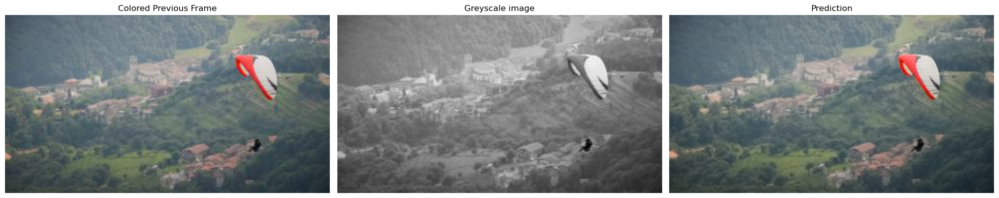

In [16]:
train_features, train_labels = next(iter(train_dataloader))

prediction = model(train_features.to(device))
prediction = prediction.cpu()
prediction = prediction.detach()

for i in range(10):
    col_img, flow_img, grey_img, pred_img = data_to_images(train_features[i], prediction[i], use_flow=use_flow, input_only=False)

    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    axs[0].imshow(col_img)
    axs[0].axis('off')
    axs[0].set_title('Colored Previous Frame')

    axs[1].imshow(grey_img, cmap='gray')
    axs[1].axis('off')
    axs[1].set_title('Greyscale image')

    """
    axs[2].imshow(uv_2_rgb(flow_img))
    axs[2].axis('off')
    axs[2].set_title('Optical flow')
    """

    axs[2].imshow(pred_img)
    axs[2].axis('off')
    axs[2].set_title('Prediction')

    plt.tight_layout()
    plt.show()